Introduction: This project aims to build a wild-life detection system using the YOLO (You Only Look Once) model and bounding boxes . The system focuses on detecting various animals in images, with the goal of providing efficient and real-time detection.

Installing Kaggle Library and Setting Kaggle API Configuration

In [1]:
!pip install kaggle


In [2]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content"


Downloading Dataset

In [3]:
!kaggle datasets download -d antoreepjana/animals-detection-images-dataset -p /content/data --unzip


Dataset URL: https://www.kaggle.com/datasets/antoreepjana/animals-detection-images-dataset
License(s): CC0-1.0
100% 8.92G/8.92G [07:16<00:00, 22.7MB/s]
100% 8.92G/8.92G [07:16<00:00, 21.9MB/s]


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
save_path = '/content/drive/My Drive/animals-dataset'

In [6]:
import os

target_path = '/content/drive/My Drive/animals-dataset'
os.makedirs(target_path, exist_ok=True)

Data Organization

Dataset: The dataset used in this project contains images of five different animals: Cheetah, Fox, Jaguar, Lion, and Tiger. These images are labeled and organized into training and testing sets. The dataset is publicly available on Kaggle and can be downloaded using the Kaggle API

In [7]:
import shutil

source_path_train = '/content/data/train/'
source_path_test = '/content/data/test/'

target_path_train = os.path.join(target_path, 'train')
target_path_test = os.path.join(target_path, 'test')

os.makedirs(target_path_train, exist_ok=True)
os.makedirs(target_path_test, exist_ok=True)

# List of folders to upload
folders = ['Cheetah', 'Fox', 'Jaguar', 'Lion', 'Tiger']

# Copy train folders
for folder in folders:
    shutil.copytree(os.path.join(source_path_train, folder), os.path.join(target_path_train, folder))

# Copy test folders
for folder in folders:
    shutil.copytree(os.path.join(source_path_test, folder), os.path.join(target_path_test, folder))

print("Selected folders have been uploaded to Google Drive!")

Selected folders have been uploaded to Google Drive!


Installing YOLO Library

YOLO is set up with the proper configurations, including defining paths to the dataset and output directories. This setup is essential for training and evaluating the detection model.

In [8]:
!pip install ultralytics
!yolo checks

Ultralytics 8.3.47 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 42.3/112.6 GB disk)

OS                  Linux-6.1.85+-x86_64-with-glibc2.35
Environment         Colab
Python              3.10.12
Install             pip
RAM                 12.67 GB
Disk                42.3/112.6 GB
CPU                 Intel Xeon 2.00GHz
CPU count           2
GPU                 Tesla T4, 15102MiB
GPU count           1
CUDA                12.1

numpy               ✅ 1.26.4>=1.23.0
numpy               ✅ 1.26.4<2.0.0; sys_platform == "darwin"
matplotlib          ✅ 3.8.0>=3.3.0
opencv-python       ✅ 4.10.0.84>=4.6.0
pillow              ✅ 11.0.0>=7.1.2
pyyaml              ✅ 6.0.2>=5.3.1
requests            ✅ 2.32.3>=2.23.0
scipy               ✅ 1.13.1>=1.4.1
torch               ✅ 2.5.1+cu121>=1.8.0
torch               ✅ 2.5.1+cu121!=2.4.0,>=1.8.0; sys_platform == "win32"
torchvision         ✅ 0.20.1+cu121>=0.9.0
tqdm                ✅ 4.66.6>=4.64.0
psu

In [9]:
import os
import random
import shutil
from collections import defaultdict, Counter
from pathlib import Path
from typing import Dict, List, Tuple, Optional, Iterable
import yaml

import cv2
import plotly.express as px
from plotly import subplots
from tqdm.notebook import tqdm
import torch
from ultralytics import YOLO

In [10]:
DATASET_PATH = '/content/drive/MyDrive/animals-dataset'  # Path to source dataset
MASTER_PATH = '/content/drive/MyDrive/animals-dataset-processed'  # Path where all outputs are stored (intermediate and final)
DEBUG = False # Activete to run notebook faster
CPU = False

#if not CPU:
#    assert torch.cuda.is_available(), 'CUDA not found!'

Lookup Table Class: A LookupTable class was created to manage the mapping between animal labels (Cheetah, Fox, etc.) and numerical indices.

---


Key Methods:

1.   add: Adds a new token (label) to the table.
2.   lookup: Fetches the index for a given token.
3.   inverse_lookup: Fetches the token for a given index.
4.   Supports unknown tokens (<unk>) for robustness.

In [11]:
class LookupTable:
    """Vocabulary - Label lookup table (token <-> index)."""
    def __init__(
        self,
        token_to_index: Optional[Dict[str, int]] = None,
        unknown_token: str = '<unk>',
        add_unknown_token: bool = True
    ):
        """
        Args:
            token_to_index: Predefine token to index mappings.
            unknown_token: Unknown token value.
            add_unknown_token: Use unknown token.
        """
        self._token_to_index = token_to_index
        self._unknown_token = unknown_token
        self._add_unknown_token = add_unknown_token

        if self._token_to_index is None:
            self._token_to_index = {}

        if unknown_token not in self._token_to_index and add_unknown_token:
            self._token_to_index[unknown_token] = len(self._token_to_index)

        self._index_to_token = {v: k for k, v in self._token_to_index.items()}
        self._next_index = len(self._token_to_index)

    def add(self, token: str) -> int:
        """
        Adds token to the lookup table if it does not already exist.

        Args:
            token: Label (token)

        Returns:
            label (token) index
        """
        if token in self._token_to_index:
            return self._token_to_index[token]

        new_index = self._next_index
        self._next_index += 1
        self._token_to_index[token] = new_index
        self._index_to_token[new_index] = token
        return new_index

    def lookup(self, token: str) -> int:
        """
        Acquires token index if it exists in the table.
        In case the token does not exist in the lookup table:
            - and unknown token is used then unkown token index is returned;
            - otherwise KeyError is raised

        Raises:
            KeyError: Unknown token

        Returns:
            label (token) index
        """
        if token not in self._token_to_index and self._add_unknown_token:
            return self._token_to_index[self._unknown_token]

        return self._token_to_index[token]

    def inverse_lookup(self, index: int) -> str:
        """
        Inverse to `lookup`. Acquire token by index.

        Raises:
            KeyError: Unknown index

        Returns:
            label (token)
        """
        return self._index_to_token[index]

    def __iter__(self) -> Iterable[Tuple[str, int]]:
        for token, index in self._token_to_index.items():
            yield token, index

    def __getitem__(self, token: str) -> int:
        return self.lookup(token)  # Alias for `lookup`

    def __len__(self):
        return self._next_index

Dataset Adapter: A custom AnimalToYOLODatasetAdapter class  implemented to map the original dataset to the YOLO format. This class handles dataset indexing, random sample retrieval, image loading, and annotation parsing

---
Key methods:


1.   _index_dataset: Indexes dataset into a dictionary for quick access by split (train/test) and label.
2.   get_random_samples: Fetches random samples from the dataset
3.   load_image: Loads images using OpenCV
4.   convert: Converts the dataset into YOLO's required directory structure.




In [12]:
DatasetIndex = Dict[str, Dict[str, List[str]]]
DatasetStats = Dict[str, int]


class AnimalToYOLODatasetAdapter:
    """Adapts custom animal dataset to YOLO format."""
    def __init__(self, path: str, label_filter: Optional[List[str]] = None):
        """
        Args:
            path: Path where dataset is stored
            label_filter: Use specific set of labels (remove others from dataset)
        """
        self._path = path

        self._index, self.label_stats, self.split_stats, self.label_lookup, self._size = \
            self._index_dataset(path, label_filter)

    @staticmethod
    def _index_dataset(path: str, label_filter: Optional[List[str]] = None) \
        -> Tuple[DatasetIndex, DatasetStats, DatasetStats, LookupTable, int]:
        """
        Creates datast index. Index is mapping (split -> label -> sample_id).
        Input dataset format is given in previosly defined structure.

        Args:
            path: Dataset path
            label_filter: Filter used labels

        Returns:
            Dataset index, Label stats, Split stats, dataset size
        """
        index: DatasetIndex = defaultdict(dict)
        label_stats: DatasetStats = Counter()
        split_stats: DatasetStats = Counter()
        lookup = LookupTable(add_unknown_token=False)
        size = 0

        splits = os.listdir(path)
        for split in splits:
            split_path = os.path.join(path, split)
            labels = os.listdir(split_path)
            for label in tqdm(labels, desc=f'Indexing {split}', unit='sample'):
                if label_filter is not None and label not in label_filter:
                    continue

                label_path = os.path.join(split_path, label)
                sample_ids = [Path(filename).stem for filename in os.listdir(label_path)
                              if filename != 'Label' and filename.endswith('.jpg')]
                annotations_path = os.path.join(label_path, 'Label')
                annot_sample_ids = [Path(filename).stem for filename in os.listdir(annotations_path)
                                    if filename.endswith('.txt')]
                assert set(sample_ids) == set(annot_sample_ids), 'Image sample ids and annotation sample ids do not match'

                # Update index, stats and lookup
                index[split][label] = sample_ids

                n_samples = len(sample_ids)
                label_stats[label] += n_samples
                split_stats[split] += n_samples
                size += n_samples

                lookup.add(label)

        return dict(index), dict(label_stats), dict(split_stats), lookup, size

    def __len__(self) -> int:
        return self._size

    @property
    def labels(self) -> List[str]:
        """
        Returns:
            List of labels (classes) in lookup table
        """
        return list(self.label_lookup)

    @property
    def n_labels(self) -> int:
        """
        Returns:
            Number of labels (classes) in lookup table
        """
        return len(self.label_lookup)

    def get_random_samples(self, n: int, split: str = 'train') -> List[Tuple[str, str, str]]:
        """
        Fetchen `n` random samples from dataset for chosen split.

        Args:
            n: Number of samples
            split: chosen split

        Returns:
            List of tuples (split, label, sample_id)
        """
        split_index = self._index[split]
        label_names, _ = zip(*self.labels)

        result: List[Tuple[str, str, str]] = []
        for i in range(n):
            label = random.choice(label_names)
            sample_ids = split_index[label]
            sample_id = random.choice(sample_ids)
            result.append((split, label, sample_id))

        return result

    def get_split_size(self, split: str) -> int:
        """
        Returns:
            Number of samples in split
        """
        return self.split_stats[split]

    def get_image_path(self, split: str, label: str, sample_id: str) -> str:
        """
        Animal dataset image path convention.

        Args:
            split: Split
            label: Label (token)
            sample_id: Sample id

        Returns:
            Image path
        """
        return os.path.join(self._path, split, label, f'{sample_id}.jpg')

    def load_image(self, split: str, label: str, sample_id: str) -> str:
        """
        Args:
            split: Split
            label: Label (token)
            sample_id: Sample id

        Returns:
            Loaded image
        """
        image_path = self.get_image_path(split, label, sample_id)
        if not os.path.exists(image_path):
            raise FileNotFound(f'Image "{image_path}" not found!')
        return cv2.imread(image_path)

    def get_annot_path(self, split: str, label: str, sample_id: str) -> str:
        """
        Animal dataset annotation path convention.

        Args:
            split: Split
            label: Label (token)
            sample_id: Sample id

        Returns:
            Annotation path
        """
        return os.path.join(self._path, split, label, 'Label', f'{sample_id}.txt')

    def parse_annot(self, split: str, label: str, sample_id: str) \
        -> List[Tuple[str, float, float, float, float]]:
        """
        Parses annotation (ground truth) file.

        Args:
            split: Split
            label: Label (token)
            sample_id: Sample id

        Returns:
            Parsed annotations
        """
        annot_path = self.get_annot_path(split, label, sample_id)
        with open(annot_path, 'r', encoding='utf-8') as f:
            lines = f.readlines()
        annots: List[Tuple[str, float, float, float, float]] = []
        for l in lines:
            items = l.split()
            label_name = ' '.join(items[:-4])
            coords = [float(v) for v in items[-4:]]
            annots.append([label_name, *coords])
        return annots

    def convert(self, path: str) -> None:
        """
        Converts dataset tp YOLO format.

        Args:
            path: Output path
        """
        for split in self._index:
            split_path = os.path.join(path, split)
            images_path = os.path.join(split_path, 'images')
            labels_path = os.path.join(split_path, 'labels')
            Path(images_path).mkdir(parents=True, exist_ok=True)
            Path(labels_path).mkdir(parents=True, exist_ok=True)

            for label, sample_ids in tqdm(self._index[split].items(), desc='Converting to Yolo format', total=len(self._index[split])):
                assert len(sample_ids) == len(set(sample_ids))
                for sample_id in sample_ids:
                    image_path = self.get_image_path(split, label, sample_id)
                    new_image_path = os.path.join(images_path, f'{sample_id}.jpg')
                    annots = self.parse_annot(split, label, sample_id)
                    new_annot_path = os.path.join(labels_path, f'{sample_id}.txt')

                    # Image needs to be loaded in order to read width and height
                    # which are required for coordinate normalization
                    image = self.load_image(split, label, sample_id)
                    h, w, _ = image.shape

                    # Conversion
                    converted_annot: List[Tuple[int, float, float, float, float]] = []
                    for label, x_min, y_min, x_max, y_max in annots:
                        label_index = self.label_lookup[label]
                        x_center = (x_min + x_max) / (2 * w)
                        y_center = (y_min + y_max) / (2 * h)
                        width = (x_max - x_min) / w
                        height = (y_max - y_min) / h

                        converted_annot.append((label_index, x_center, y_center, width, height))

                    # Save data
                    with open(new_annot_path, 'a', encoding='utf-8') as f:
                        converted_annot_lines = [' '.join([str(v) for v in row]) for row in converted_annot]
                        f.write('\n'.join(converted_annot_lines))
                        f.write('\n')

                    if not os.path.exists(new_image_path):
                        shutil.copy(image_path, new_image_path)


adapter = AnimalToYOLODatasetAdapter(
    path=DATASET_PATH,
    label_filter=['Tiger'] if DEBUG else None
)

print(f'Total number of samples in the dataset is {len(adapter)}.')
print(f'Total number of classes in the dataset is {adapter.n_labels}.')
print(f'Train dataset size is {adapter.get_split_size("train")} (images). Test dataset size is {adapter.get_split_size("test")} (images)')

Indexing train:   0%|          | 0/5 [00:00<?, ?sample/s]

Indexing test:   0%|          | 0/5 [00:00<?, ?sample/s]

Total number of samples in the dataset is 1169.
Total number of classes in the dataset is 5.
Train dataset size is 901 (images). Test dataset size is 268 (images)


Visualization of Dataset sampled

In [13]:
fig = px.histogram(x=list(adapter.label_stats.keys()), y=list(adapter.label_stats.values())) \
        .update_layout(xaxis_title="Class", yaxis_title="Class size", xaxis={'categoryorder':'total descending'})
fig.show()

Visualize dataset samples: Displays images with their corresponding bounding boxes for better interpretability of the data

In [14]:
def visualize_samples(
    adapter: AnimalToYOLODatasetAdapter,
    n_rows: int,
    n_cols: int,
    bbox_color: Tuple[int, int, int] = (255, 0, 0),  # RBG - RED
    model: Optional[YOLO] = None
) -> None:
    """
    Visualizes image sample with ground truths and (optionally) model predictions.
    Number of images is equal to product of `n_rows` and `n_cols`

    Args:
        adapter: Animal dataset to YOLO adapter
        n_rows: Number of rows in image matrix
        n_cols: Number of cols in image matrix
        bbox_color: Ground truth bbox color
        model: Model to generate prediction for given images
    """
    n: int = n_rows * n_cols

    viz_samples = adapter.get_random_samples(n)
    fig = subplots.make_subplots(rows=n_rows, cols=n_cols)
    for plot_index, (split, label, sample_id) in enumerate(viz_samples):
        row = plot_index // n_cols + 1
        col = plot_index % n_cols + 1
        image = adapter.load_image(split, label, sample_id)
        label_index = adapter.label_lookup.lookup(label)

        # Visualize ground truth
        for _, x_min, y_min, x_max, y_max in adapter.parse_annot(split, label, sample_id):
            x_min, y_min, x_max, y_max = [int(v) for v in [x_min, y_min, x_max, y_max]]
            labek_text = f'{label} ({label_index})'
            image = cv2.rectangle(image, (x_min, y_min), (x_max, y_max), color=bbox_color, thickness=4)
            image = cv2.putText(image, label, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 2, bbox_color, 3)

        if model is not None:
            # Visualize model predictions
            prediction = model.predict([image], imgsz=512, conf=0.3)
            for p in prediction:
                image = p.plot()

        subfig = px.imshow(image)
        fig.add_trace(subfig.data[0], row=row, col=col)

    fig = fig.update_xaxes(showticklabels=False)
    fig = fig.update_yaxes(showticklabels=False)
    fig = fig.update_layout(
        autosize=False,
        width=1200,
        height=600
    )
    fig.show()

visualize_samples(adapter, 1, 3)

The convert function is typically used as a preparatory step before training a YOLO model. It ensures that the dataset is formatted correctly for YOLO to read during training and validation.

In [15]:
adapter.convert(MASTER_PATH)

Converting to Yolo format:   0%|          | 0/5 [00:00<?, ?it/s]

Converting to Yolo format:   0%|          | 0/5 [00:00<?, ?it/s]

Dataset splitting operation

In [16]:
import os
import random
import shutil

# Paths
data_path = '/content/drive/MyDrive/animals-dataset-processed/test/images'
label_path = '/content/drive/MyDrive/animals-dataset-processed/test/labels'
test_img_path = '/content/drive/MyDrive/animals-dataset-processed/test/images'
val_img_path = '/content/drive/MyDrive/animals-dataset-processed/val/images'
test_label_path = '/content/drive/MyDrive/animals-dataset-processed/test/labels'
val_label_path = '/content/drive/MyDrive/animals-dataset-processed/val/labels'

# Create directories if they don't exist
os.makedirs(test_img_path, exist_ok=True)
os.makedirs(val_img_path, exist_ok=True)
os.makedirs(test_label_path, exist_ok=True)
os.makedirs(val_label_path, exist_ok=True)

# List all images
images = [f for f in os.listdir(data_path) if f.endswith('.jpg')]
random.shuffle(images)

# Split (50% test, 50% val)
train_size = int(0.5 * len(images))

train_images = images[:train_size]
val_images = images[train_size:]

# Move files
for img in val_images:
    shutil.move(os.path.join(data_path, img), val_img_path)
    label_file = img.replace('.jpg', '.txt')
    shutil.move(os.path.join(label_path, label_file), val_label_path)

print("Dataset split completed!")

Dataset split completed!


In [17]:
import os

# Base directory path
base_dir = "/content/drive/MyDrive/animals-dataset-processed"

# Subdirectories
folders = ['train', 'test', 'val']

# Count images in each folder
for folder in folders:
    image_folder = os.path.join(base_dir, folder, "images")
    if os.path.exists(image_folder):
        num_images = len([file for file in os.listdir(image_folder) if file.lower().endswith(('.png', '.jpg', '.jpeg'))])
        print(f"Number of images in {folder}: {num_images}")
    else:
        print(f"Folder {image_folder} does not exist.")

Number of images in train: 871
Number of images in test: 124
Number of images in val: 125


Creating a configuration file (config.yaml) required by YOLO training pipelines

In [18]:
class_names = [name for name, _ in adapter.label_lookup]
config = {
    'path': MASTER_PATH,
    'train': 'train/images',
    'val': 'val/images',
    'test': 'test/images',
    'nc': len(adapter.label_lookup),  # number of classes
    'names': class_names
}

config_path = os.path.join(MASTER_PATH, 'config.yaml')
with open(config_path, 'w', encoding='utf-8') as f:
    yaml.dump(config, f)

print(yaml.dump(config))

names:
- Cheetah
- Fox
- Jaguar
- Lion
- Tiger
nc: 5
path: /content/drive/MyDrive/animals-dataset-processed
test: test/images
train: train/images
val: val/images



Training a YOLOv8 model on animal dataset for object detection. This code loads a YOLOv8 Nano model, fine-tunes it using a custom dataset (defined in the config.yaml file), and trains the model for 50 epochs. After training, it evaluates the model’s performance on the validation set and prints the evaluation results. The training process adjusts the model’s weights to improve accuracy for detecting objects in images
based on the dataset.


*  Pre-trained YOLOv8 Nano model (yolov8n.pt) is loaded

*   Training is done using the dataset specified in the config.yaml file.

*   Hyperparameters such as epochs, batch size, image size, and device are defined.



In [19]:
import torch
from ultralytics import YOLO

# Load a pre-trained YOLOv8n model
model = YOLO('yolov8n.pt')

# Define the dataset configuration file
data_config = '/content/drive/MyDrive/animals-dataset-processed/config.yaml'

# Hyperparameters (adjust as needed)
epochs = 50
batch_size = 16
img_size = 640
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Train the model and specify the save directory
results = model.train(
    data=data_config,
    epochs=epochs,
    batch=batch_size,
    imgsz=img_size,
    device=device,
    verbose=True,  # Enable detailed training logs
    project='/content/drive/MyDrive/animals-dataset-processed',  # Specify save directory
    name='model'  # Folder name under the project directory
)

# Evaluate the model on the validation set
val_results = model.val()
print(val_results)


WARNING ⚠️ 'name=model' automatically updated to 'name=yolov8n'.
Ultralytics 8.3.47 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/animals-dataset-processed/config.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=/content/drive/MyDrive/animals-dataset-processed, name=yolov8n, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks

train: Scanning /content/drive/MyDrive/animals-dataset-processed/train/labels... 871 images, 0 backgrounds, 0 corrupt: 100%|██████████| 871/871 [00:12<00:00, 67.08it/s] 


train: New cache created: /content/drive/MyDrive/animals-dataset-processed/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning:

A new version of Albumentations is available: 1.4.22 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.

val: Scanning /content/drive/MyDrive/animals-dataset-processed/val/labels... 125 images, 0 backgrounds, 0 corrupt: 100%|██████████| 125/125 [00:02<00:00, 53.17it/s]


val: New cache created: /content/drive/MyDrive/animals-dataset-processed/val/labels.cache
Plotting labels to /content/drive/MyDrive/animals-dataset-processed/yolov8n/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/animals-dataset-processed/yolov8n
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50       2.2G     0.6902      2.739      1.266         25        640: 100%|██████████| 55/55 [00:33<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.54it/s]

                   all        125        136      0.614      0.353      0.475      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.22G     0.7812       1.93      1.316         25        640: 100%|██████████| 55/55 [00:30<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.04it/s]


                   all        125        136      0.625       0.39      0.437      0.289

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.24G      0.783      1.742      1.319         19        640: 100%|██████████| 55/55 [00:26<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.10it/s]

                   all        125        136       0.39      0.372      0.171      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.23G     0.8381      1.672      1.341         20        640: 100%|██████████| 55/55 [00:28<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.02it/s]

                   all        125        136        0.3      0.517      0.426      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.23G     0.8496      1.524      1.356         22        640: 100%|██████████| 55/55 [00:29<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.13it/s]

                   all        125        136      0.449      0.632      0.528       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.23G     0.8313      1.449       1.32         21        640: 100%|██████████| 55/55 [00:29<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.01it/s]

                   all        125        136      0.648      0.508      0.691      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.22G     0.7902      1.378        1.3         18        640: 100%|██████████| 55/55 [00:24<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.25it/s]

                   all        125        136      0.473      0.702      0.664      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.25G     0.7662      1.281       1.29         21        640: 100%|██████████| 55/55 [00:28<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.05it/s]

                   all        125        136      0.648      0.709       0.77      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.23G     0.7461       1.23      1.258         19        640: 100%|██████████| 55/55 [00:25<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.14it/s]

                   all        125        136      0.627      0.714      0.732      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.25G     0.7497      1.171      1.267         19        640: 100%|██████████| 55/55 [00:24<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.30it/s]

                   all        125        136      0.661      0.761      0.783      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.22G     0.6949      1.099      1.239         21        640: 100%|██████████| 55/55 [00:31<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.61it/s]

                   all        125        136      0.727      0.795      0.843      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.25G     0.6985      1.095      1.235         17        640: 100%|██████████| 55/55 [00:25<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.29it/s]

                   all        125        136      0.785      0.764      0.854      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.23G     0.7023      1.035      1.243         20        640: 100%|██████████| 55/55 [00:25<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        125        136      0.622       0.69      0.714      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.24G     0.6955      1.083      1.248         22        640: 100%|██████████| 55/55 [00:27<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.34it/s]

                   all        125        136      0.697      0.786      0.843      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.22G     0.6945      1.007      1.234         23        640: 100%|██████████| 55/55 [00:25<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        125        136      0.731      0.775      0.828      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.23G     0.6678     0.9543      1.208         21        640: 100%|██████████| 55/55 [00:29<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.20it/s]

                   all        125        136      0.726      0.733      0.827      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.24G     0.6593     0.9693        1.2         15        640: 100%|██████████| 55/55 [00:28<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.38it/s]

                   all        125        136      0.791      0.747       0.85      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.23G     0.6364     0.9483      1.191         16        640: 100%|██████████| 55/55 [00:24<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.40it/s]

                   all        125        136      0.763      0.865      0.885      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.22G     0.6458     0.9022      1.214         28        640: 100%|██████████| 55/55 [00:25<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.50it/s]

                   all        125        136      0.751      0.699      0.825      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.23G     0.6344     0.8701      1.179         14        640: 100%|██████████| 55/55 [00:28<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]

                   all        125        136      0.799      0.787      0.843      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.23G     0.6239     0.9066      1.186         19        640: 100%|██████████| 55/55 [00:28<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.29it/s]

                   all        125        136      0.803      0.839      0.903      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.24G     0.5838     0.8136      1.153         18        640: 100%|██████████| 55/55 [00:25<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.02it/s]

                   all        125        136      0.691      0.771      0.814      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.23G     0.6038     0.8195      1.166         27        640: 100%|██████████| 55/55 [00:28<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.23it/s]

                   all        125        136      0.779      0.794      0.872       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.23G     0.5894     0.8107       1.16         19        640: 100%|██████████| 55/55 [00:25<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.83it/s]

                   all        125        136      0.758      0.722      0.817      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.23G     0.5964     0.7954      1.162         13        640: 100%|██████████| 55/55 [00:25<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.43it/s]

                   all        125        136       0.72      0.851      0.865      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.23G     0.5728     0.7557       1.14         20        640: 100%|██████████| 55/55 [00:28<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        125        136      0.832      0.881      0.928      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.22G     0.5656     0.7958      1.131         21        640: 100%|██████████| 55/55 [00:26<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.26it/s]

                   all        125        136       0.76      0.859       0.87      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.23G     0.5568     0.7646      1.127         18        640: 100%|██████████| 55/55 [00:24<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.29it/s]

                   all        125        136      0.909      0.753      0.883      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.23G     0.5502     0.7024      1.119         23        640: 100%|██████████| 55/55 [00:28<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.26it/s]

                   all        125        136      0.911      0.808      0.925      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.23G     0.5433     0.7009      1.121         25        640: 100%|██████████| 55/55 [00:29<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]

                   all        125        136      0.924       0.81      0.932      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.22G      0.532     0.6849      1.111         18        640: 100%|██████████| 55/55 [00:24<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.78it/s]

                   all        125        136      0.793      0.891        0.9       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.22G     0.5308      0.691      1.112         17        640: 100%|██████████| 55/55 [00:27<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.22it/s]

                   all        125        136      0.856      0.856      0.904      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.23G      0.511     0.6747      1.101         23        640: 100%|██████████| 55/55 [00:26<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.23it/s]

                   all        125        136      0.907      0.846       0.91      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.24G     0.5086     0.6577      1.091         19        640: 100%|██████████| 55/55 [00:25<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.55it/s]

                   all        125        136        0.9      0.802      0.927      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.24G     0.5234     0.6373      1.114         23        640: 100%|██████████| 55/55 [00:31<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.15it/s]

                   all        125        136      0.849      0.876      0.912      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.23G     0.4867      0.635      1.088         21        640: 100%|██████████| 55/55 [00:27<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.25it/s]

                   all        125        136      0.874      0.866      0.912      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.23G     0.4921     0.6164      1.089         21        640: 100%|██████████| 55/55 [00:25<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.26it/s]

                   all        125        136      0.837      0.838      0.909      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.24G     0.4825     0.6169      1.069         23        640: 100%|██████████| 55/55 [00:27<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.67it/s]

                   all        125        136      0.786      0.868       0.88      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.22G     0.4757     0.6069      1.084         19        640: 100%|██████████| 55/55 [00:28<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.55it/s]

                   all        125        136      0.782      0.909      0.924      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.23G     0.4711     0.5947      1.073         15        640: 100%|██████████| 55/55 [00:30<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.28it/s]

                   all        125        136      0.849      0.867      0.914      0.783


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.22G     0.3952     0.4951      1.048          7        640: 100%|██████████| 55/55 [00:27<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.07it/s]

                   all        125        136      0.849      0.833      0.901      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.23G     0.3567     0.4199     0.9972         10        640: 100%|██████████| 55/55 [00:27<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.40it/s]

                   all        125        136      0.765      0.896      0.914      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.22G     0.3536     0.4265      1.009          8        640: 100%|██████████| 55/55 [00:25<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.26it/s]

                   all        125        136      0.827      0.831      0.902      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.23G     0.3411     0.3731     0.9761          8        640: 100%|██████████| 55/55 [00:28<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.30it/s]

                   all        125        136      0.763      0.903      0.881      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.23G     0.3309      0.353     0.9688          7        640: 100%|██████████| 55/55 [00:26<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.11it/s]

                   all        125        136      0.906      0.764      0.868      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.22G     0.3136      0.351     0.9702          7        640: 100%|██████████| 55/55 [00:25<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.67it/s]

                   all        125        136      0.815      0.895      0.907       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.22G     0.3113     0.3499     0.9663          7        640: 100%|██████████| 55/55 [00:24<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.30it/s]

                   all        125        136      0.924      0.772      0.919      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.23G     0.2988     0.3429     0.9402          7        640: 100%|██████████| 55/55 [00:27<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]

                   all        125        136       0.92      0.802      0.922      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.22G     0.2891     0.3379     0.9372          7        640: 100%|██████████| 55/55 [00:27<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.75it/s]

                   all        125        136      0.799      0.898      0.915      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.23G     0.2896     0.3369     0.9429          8        640: 100%|██████████| 55/55 [00:26<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.29it/s]

                   all        125        136      0.819      0.886      0.921      0.825



50 epochs completed in 0.441 hours.
Optimizer stripped from /content/drive/MyDrive/animals-dataset-processed/yolov8n/weights/last.pt, 6.3MB
Optimizer stripped from /content/drive/MyDrive/animals-dataset-processed/yolov8n/weights/best.pt, 6.3MB

Validating /content/drive/MyDrive/animals-dataset-processed/yolov8n/weights/best.pt...
Ultralytics 8.3.47 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.14it/s]


                   all        125        136      0.819      0.886      0.921      0.824
               Cheetah         12         12      0.588      0.953      0.858      0.756
                   Fox         37         39      0.918      0.974       0.96       0.82
                Jaguar         12         12      0.886      0.646      0.889      0.815
                  Lion         57         60      0.903      0.933      0.963      0.843
                 Tiger         13         13      0.801      0.923      0.935      0.888
Speed: 0.3ms preprocess, 3.3ms inference, 0.0ms loss, 5.5ms postprocess per image
Results saved to /content/drive/MyDrive/animals-dataset-processed/yolov8n
Ultralytics 8.3.47 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/MyDrive/animals-dataset-processed/val/labels.cache... 125 images, 0 backgrounds, 0 corrupt: 100%|██████████| 125/125 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.17it/s]


                   all        125        136      0.814      0.879      0.922      0.828
               Cheetah         12         12      0.584      0.917      0.859      0.773
                   Fox         37         39      0.896      0.974      0.959      0.821
                Jaguar         12         12      0.886      0.646      0.889      0.813
                  Lion         57         60      0.904      0.933      0.963      0.842
                 Tiger         13         13      0.801      0.923      0.938      0.891
Speed: 0.3ms preprocess, 7.4ms inference, 0.0ms loss, 3.2ms postprocess per image
Results saved to /content/drive/MyDrive/animals-dataset-processed/yolov8n2
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f7e8f2faa40>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)

Evaluating the trained YOLO model on the test set

In [20]:
# Evaluate on the test set
test_results = model.val(data='/content/drive/MyDrive/animals-dataset-processed/config.yaml', split='test')
print(test_results)

Ultralytics 8.3.47 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/drive/MyDrive/animals-dataset-processed/test/labels... 124 images, 0 backgrounds, 0 corrupt: 100%|██████████| 124/124 [00:02<00:00, 61.42it/s]


val: New cache created: /content/drive/MyDrive/animals-dataset-processed/test/labels.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:07<00:00,  1.03it/s]


                   all        124        148      0.839      0.858      0.907      0.776
               Cheetah         23         27      0.739      0.778      0.821      0.716
                   Fox         32         33      0.878       0.97      0.978      0.842
                Jaguar         26         30      0.955      0.708      0.909      0.713
                  Lion         43         44       0.94      0.977      0.982      0.882
                 Tiger         13         14      0.681      0.857      0.843       0.73
Speed: 0.4ms preprocess, 11.1ms inference, 0.0ms loss, 5.6ms postprocess per image
Results saved to /content/drive/MyDrive/animals-dataset-processed/yolov8n3
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f7e8f7bb8b0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B

Using a trained YOLOv8 model to perform object detection on any new image from internet


image 1/1 /content/test.jpg: 448x640 1 Cheetah, 40.6ms
Speed: 9.3ms preprocess, 40.6ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


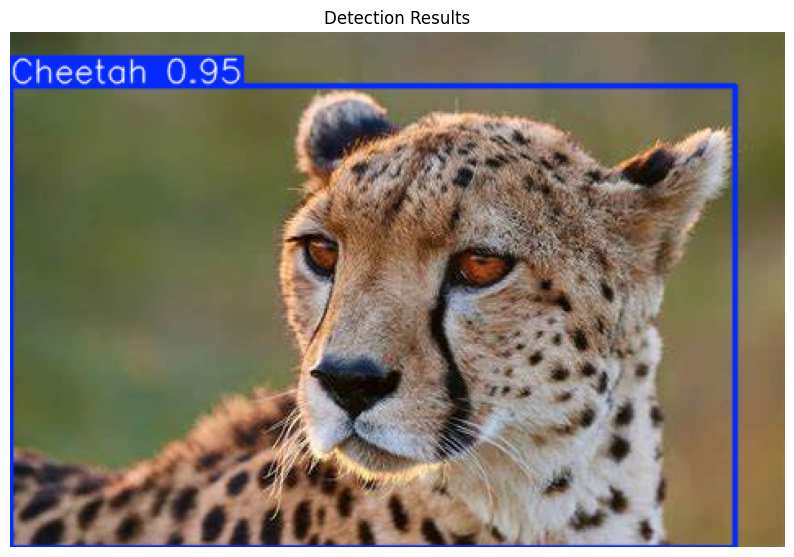

In [21]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load the saved YOLOv8 model
model = YOLO('/content/drive/MyDrive/animals-dataset-processed/yolov8n/weights/best.pt')  # Replace with the path to your saved model

# Test on a single image
image_path = '/content/test.jpg'  # Replace with your image path
results = model(image_path)

# Display the results
#results.render()  # Render detections on the image
output_image = results[0].plot()  # Get the annotated image

# Show the image with matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB
plt.axis('off')
plt.title('Detection Results')
plt.show()

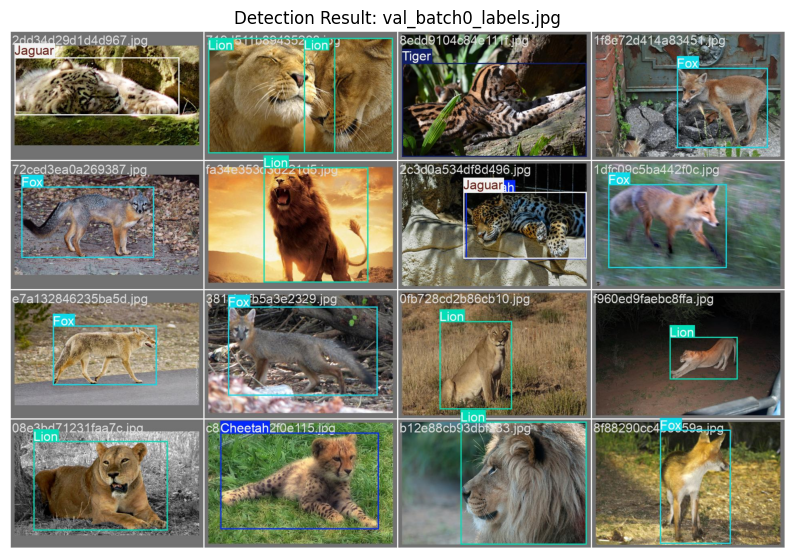

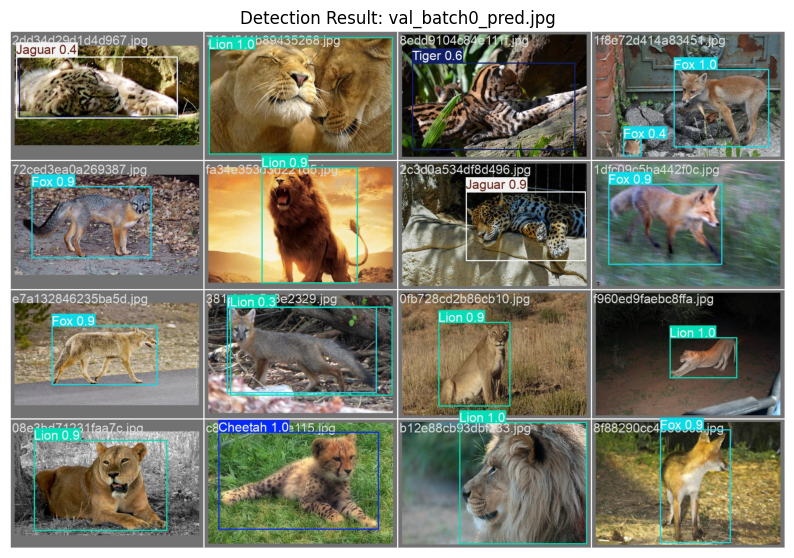

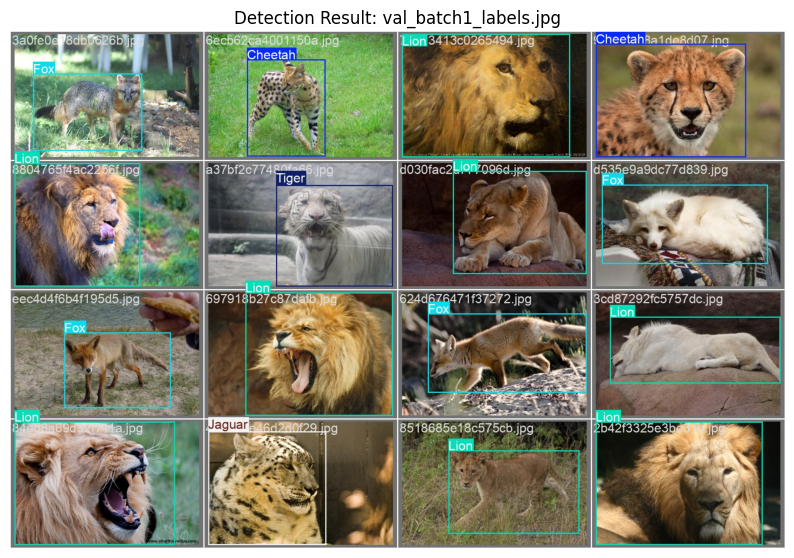

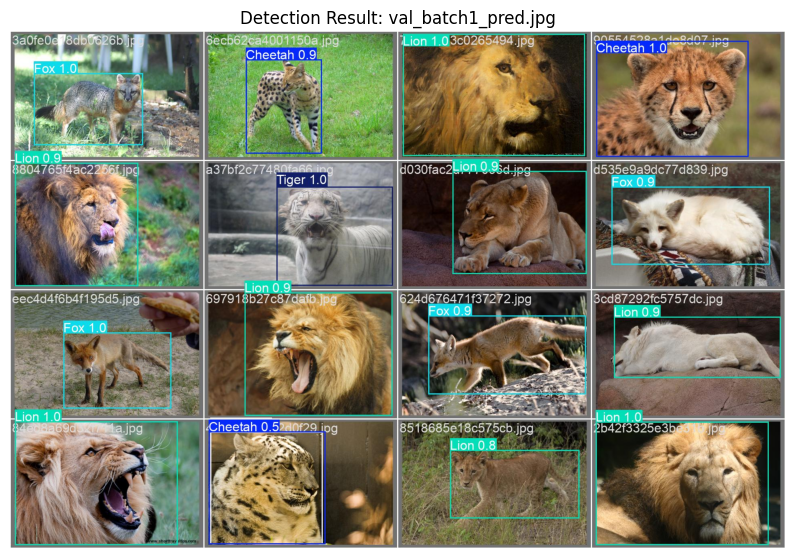

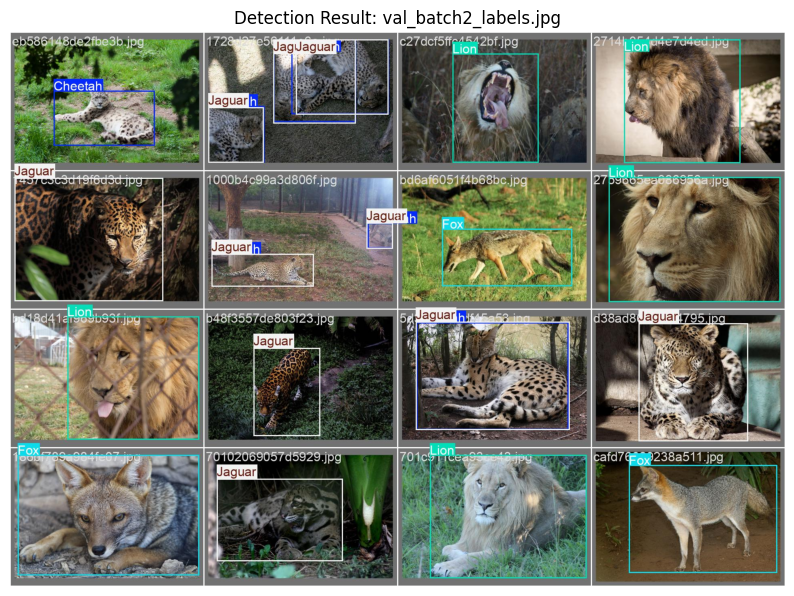

...

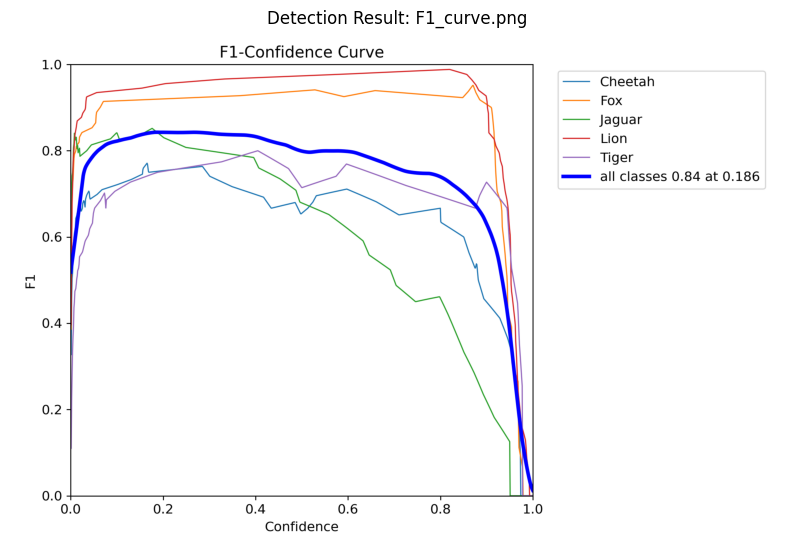

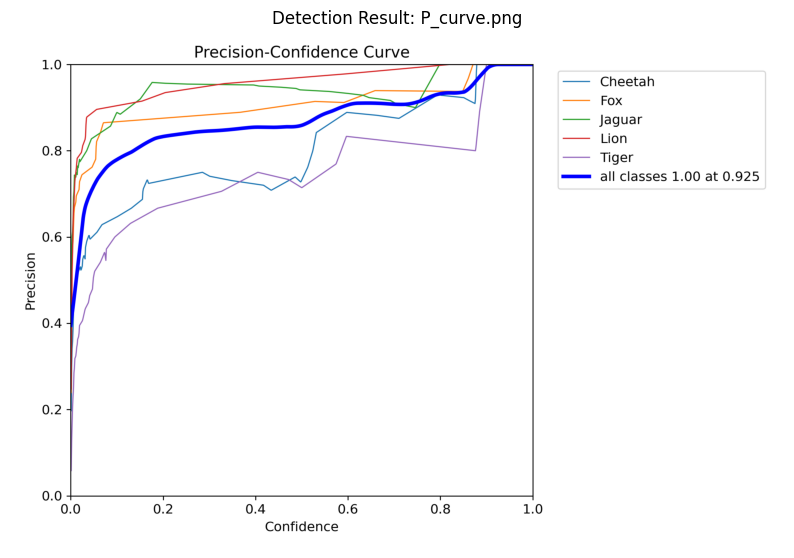

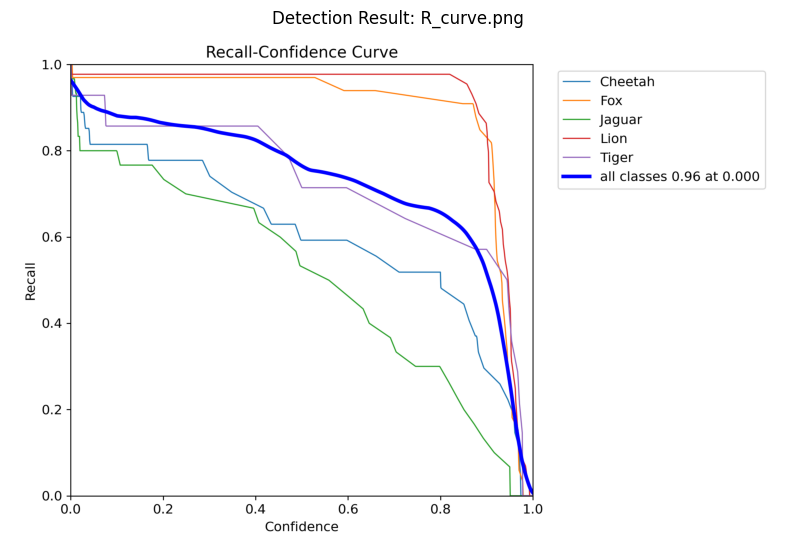

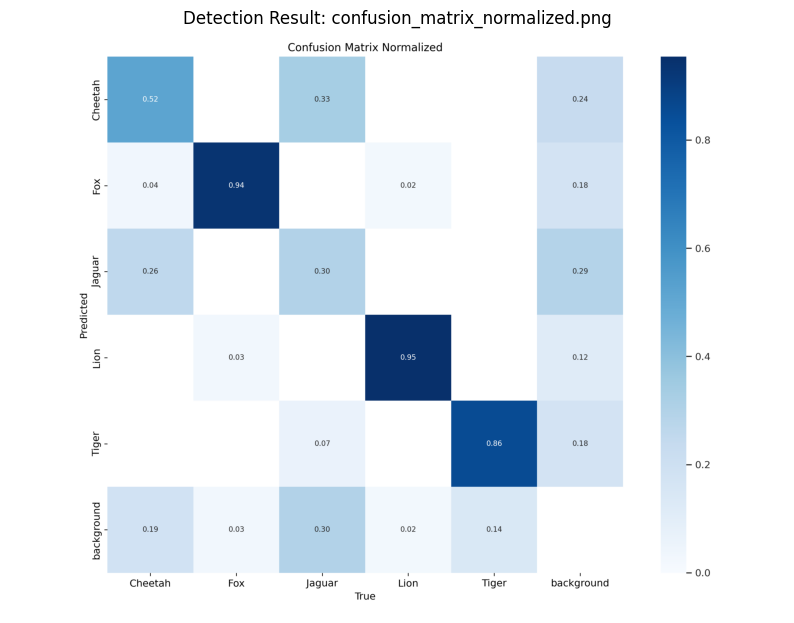

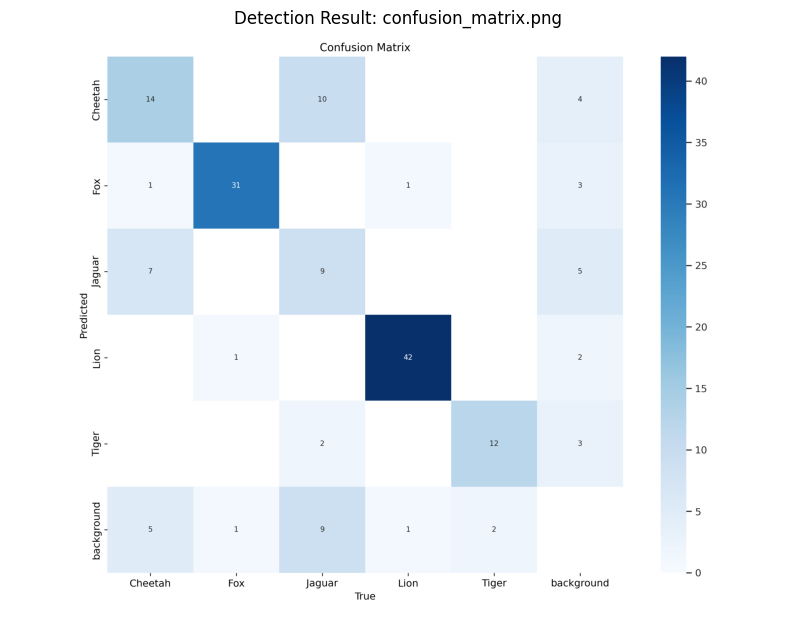

In [22]:
import cv2
import os
import matplotlib.pyplot as plt

# Define the path where the results are saved
results_folder = '/content/drive/MyDrive/animals-dataset-processed/yolov8n3'

# List all the images saved in the folder
result_files = [f for f in os.listdir(results_folder) if f.endswith('.jpg') or f.endswith('.png')]

# Loop through the saved result files and display them
for result_file in result_files:
    # Construct the full path to the image
    result_path = os.path.join(results_folder, result_file)

    # Read the image using OpenCV
    image = cv2.imread(result_path)

    # Convert from BGR to RGB for displaying with matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display the image using matplotlib
    plt.figure(figsize=(10, 10))
    plt.imshow(image_rgb)
    plt.axis('off')  # Hide axes
    plt.title(f'Detection Result: {result_file}')
    plt.show()
